<a href="https://colab.research.google.com/github/szykry/CVML_HW/blob/feature%2FOrsi/automata_depth_segment_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Homework



In [0]:
# Evaluation
from HW.evaluate import evaluate

#file = open('HW/annotations.pickle','rb')
#predictions = pickle.load(file)

evaluate(predictions)

ModuleNotFoundError: ignored

# Tradition



In [19]:
#******************INIT*******************
!pip install -U torch torchvision numpy opencv-python



# Homework dataset
!wget http://deeplearning.iit.bme.hu/CVS/HW.zip
!unzip -qq HW.zip
!rm HW.zip

# Traffic Sign Classification set
!wget http://deeplearning.iit.bme.hu/CVS/trafficSignsHW.zip
!unzip -qq trafficSignsHW.zip
!rm trafficSignsHW.zip


!git clone https://github.com/szykry/CVML_HW.git

# Set root folder
import os
name = "/content/HW/"
os.chdir(name)
!pwd

 #OpenCV
import cv2

#Numpy - numeric library
import numpy as np

#Plotting
import matplotlib.pyplot as plt
%matplotlib inline

#*******************END OF INIT*************

Requirement already up-to-date: torch in /usr/local/lib/python3.6/dist-packages (1.5.0+cu101)
Requirement already up-to-date: torchvision in /usr/local/lib/python3.6/dist-packages (0.6.0+cu101)
Requirement already up-to-date: numpy in /usr/local/lib/python3.6/dist-packages (1.18.4)
Requirement already up-to-date: opencv-python in /usr/local/lib/python3.6/dist-packages (4.2.0.34)
--2020-05-23 10:56:09--  http://deeplearning.iit.bme.hu/CVS/HW.zip
Resolving deeplearning.iit.bme.hu (deeplearning.iit.bme.hu)... 152.66.243.112
Connecting to deeplearning.iit.bme.hu (deeplearning.iit.bme.hu)|152.66.243.112|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 14446460 (14M) [application/zip]
Saving to: ‘HW.zip’

HW.zip              100%[===================>]  13.78M  9.99MB/s    in 1.4s    

2020-05-23 10:56:11 (9.99 MB/s) - ‘HW.zip’ saved [14446460/14446460]

--2020-05-23 10:56:14--  http://deeplearning.iit.bme.hu/CVS/trafficSignsHW.zip
Resolving deeplearning.iit.bme.hu (de

In [0]:
# Get all subfolders in a directory
import os
myFolderList = [f.path for f in os.scandir(path) if f.is_dir()]

NameError: ignored

In [0]:
# Get all files with extension in a directory
import glob
import re
 
def sorted_nicely( l ):
    """ Sort the given iterable in the way that humans expect."""
    convert = lambda text: int(text) if text.isdigit() else text
    alphanum_key = lambda key: [ convert(c) for c in re.split('([0-9]+)', key) ]
    return sorted(l, key = alphanum_key)
 
names = sorted_nicely(glob.glob1(path, "*.extension"))

NameError: ignored

In [0]:
# Class names
classNames = ['traffic sign', 'vehicle', 'cactus']
subclassNames = [
    ['Bump', 'Bumpy road', 'Bus stop', 'Children', 'Crossing (blue)', 'Crossing (red)', 'Cyclists',
     'Danger (other)', 'Dangerous left turn', 'Dangerous right turn', 'Give way', 'Go ahead', 'Go ahead or left',
     'Go ahead or right', 'Go around either way', 'Go around left', 'Go around right', 'Intersection', 'Limit 100',
     'Limit 120', 'Limit 20', 'Limit 30', 'Limit 50', 'Limit 60', 'Limit 70', 'Limit 80', 'Limit 80 over',
     'Limit over', 'Main road', 'Main road over', 'Multiple dangerous turns', 'Narrow road (left)',
     'Narrow road (right)', 'No entry', 'No entry (both directions)', 'No entry (truck)', 'No stopping', 'No takeover',
     'No takeover (truck)', 'No takeover (truck) end', 'No takeover end', 'No waiting', 'One way road',
     'Parking', 'Road works', 'Roundabout', 'Slippery road', 'Stop', 'Traffic light', 'Train crossing',
     'Train crossing (no barrier)', 'Wild animals', 'X - Priority', 'X - Turn left', 'X - Turn right'],
    ['SUV','truck','plane'],
    ['happy','sad','angry','evil']
]

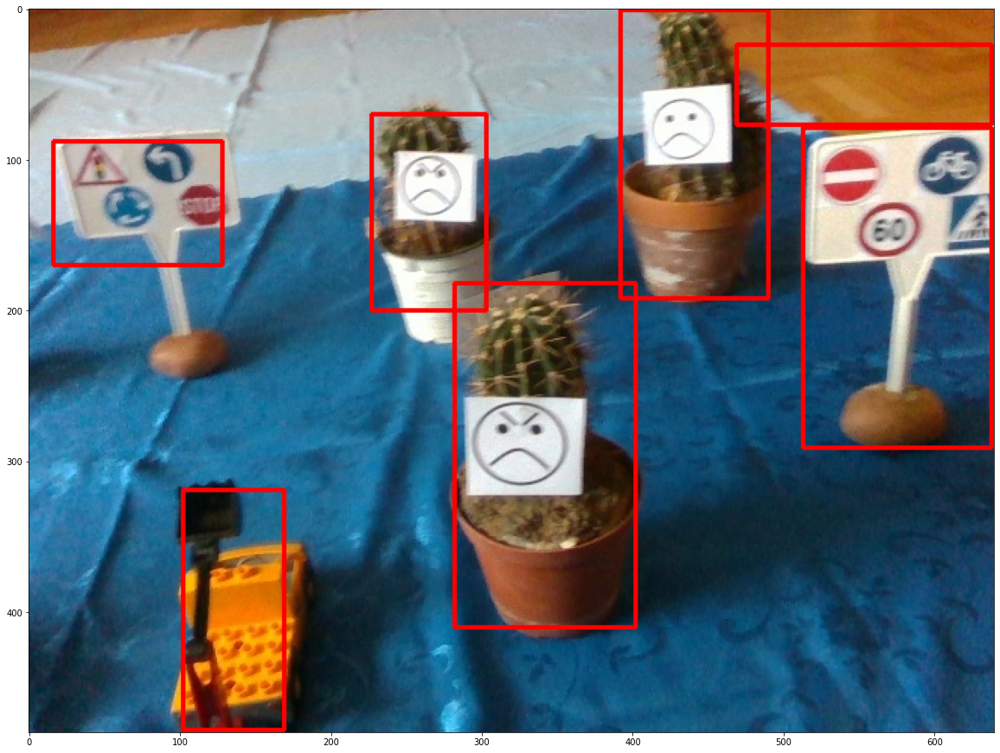

In [0]:
def minMaxLoc(img):
  Xmin = 999;
  Xmax = 0;
  Ymin = 999;
  Ymax = 0;
  
  for i in range(img.shape[0]):
    sor =img[i,:]
    mean=np.count_nonzero(sor)
    if ((Ymin == 999) & (mean > 0)):
      Ymin=i
    if ( mean > 0):
      Ymax = i

  for i in range(img.shape[1]):
    oszlop =img[:,i]
    mean=np.count_nonzero(oszlop)
    if ((Xmin == 999) & (mean > 0)):
      Xmin=i
    if ( mean > 0):
      Xmax = i

  return Xmin,Xmax,Ymin,Ymax

def watershed(edges,img,debug=False):
  kernel = np.ones((3,3),np.uint8)
  #widen edges to make them touch
  edges = cv2.dilate(edges, kernel,iterations=1)

  ret, thresh = cv2.threshold(edges,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
  if debug:
    plt.figure(figsize=(7,7))
    plt.imshow(thresh,cmap='gray')

  sure_fg = cv2.erode(thresh,kernel,iterations=1)
  sure_bg = cv2.dilate(thresh,kernel,iterations=1)

  # Uncertain region(borders)
  unknown = cv2.subtract(sure_bg,sure_fg)

  if debug:
    plt.figure(figsize=(7,7))
    plt.imshow(sure_fg,cmap='gray')

  # Label separate foreground pathes
  ret, markers = cv2.connectedComponents(sure_fg)
      
  # Add one to all labels so that sure background is not 0, but 1
  markers = markers+1
  # Now, mark the region of unknown with zero
  markers[unknown==255] = 0

  if debug:
    plt.figure(figsize=(7,7))
    plt.imshow(markers)
    
  # Runwatershed
  markers = cv2.watershed(img,markers)
  if debug:
    plt.figure(figsize=(15,15))
    plt.subplot(1,2,1)
    plt.imshow(markers)
    plt.subplot(1,2,2)
    plt.imshow(img)

  return markers

def makeBoundingBox(image):
  imagecopy = image.copy()
  imagecopy = cv2.cvtColor(imagecopy,cv2.COLOR_RGB2GRAY)
  imagecopy[imagecopy != 0] = 255;

  xmin,xmax,ymin,ymax = minMaxLoc(imagecopy)

  rect = (xmin,ymin,xmax-xmin,ymax-ymin)

  #rects = objFinder(imagecopy,100,10,10)

  #for i in range(len(rects)):
  #color = (255,255,0)
  #cv2.rectangle(imagecopy, (rect[0],rect[1]), (rect[0]+rect[2],rect[1]+rect[3]), color, 2)


  #plt.figure(figsize=(20,20))
  #plt.imshow(imagecopy,cmap='gray')
  return rect
  #contours,  = cv2.findContours(imgcopy, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)


#************************************ MAIN ******************************************************

def depth_segmenter(inputImage, inputDepthImage, debug=False):
  # Read images
  img = inputImage.copy()
  depth = inputDepthImage.copy()

  sor =depth[0,:]
  legelsoAtlag=np.true_divide(sor.sum(),np.count_nonzero(sor))

  #hatsoMaszk=cv2.inRange(depth, legelsoAtlag*0.9, np.amax(depth))
  hatsoMaszk =  np.zeros((480,640)).astype("uint8")
  hatsoMaszk[depth<legelsoAtlag*0.7]=[1]

  if debug:
    plt.figure(figsize=(20,20))
    plt.imshow(hatsoMaszk,cmap='gray')

  # convert to RGB
  img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
  img_hsv = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)

  lower_range = np.array([90,0,0])
  upper_range = np.array([120,255,220])

  maszk=cv2.inRange(img_hsv, lower_range, upper_range)

  maszkNegative = cv2.bitwise_not(maszk)
  
  if debug:
    out = cv2.bitwise_and(img_hsv,img_hsv,mask = maszkNegative)
    plotolni = cv2.cvtColor(out, cv2.COLOR_HSV2RGB)
    plt.figure(figsize=(20,20))
    plt.imshow(plotolni,cmap='gray')

  hue_channel = img_hsv[:,:,0]
  avg_hue = np.average(hue_channel)
  asdasd, hue_channel_segment = cv2.threshold(hue_channel,avg_hue,255,cv2.THRESH_BINARY)
  kernel = np.ones((5,5),np.uint8)
  maszkDilation = cv2.erode(hue_channel_segment,kernel,iterations = 2)

  maszkDilation = cv2.bitwise_not(maszkDilation)
  maszkNegative = cv2.bitwise_and(maszkDilation,maszkDilation,mask = maszkNegative)
  maszkNegative = cv2.bitwise_and(maszkNegative,maszkNegative,mask = hatsoMaszk)
  
  if debug:
    plt.figure(figsize=(20,20))
    plt.imshow(maszkNegative,cmap='gray')

  # calculate foreground
  for i in range(depth.shape[0]):
    sor =depth[i,:]
    mean=np.true_divide(sor.sum(),np.count_nonzero(sor))
    sor[sor>mean-20]=0

  # for some reason doesn't work without this
 # depth2[depth==0]=0
 # img_rgb = np.where(depth2 != 0, img_rgb, [0,0,0])

  # Figure with subplots
  if debug:
    plt.figure(figsize=(30,30))
    plt.subplot(1,2,1)
#    plt.imshow(img_rgb) 
    plt.subplot(1,2,2)
    plt.imshow(depth,cmap='gray')

  # convert to uint8 from uint16
  cv2.normalize(depth, depth, 0, 255, cv2.NORM_MINMAX)
  depth=depth.astype('uint8')
  depth_8 = cv2.cvtColor(depth, cv2.COLOR_GRAY2BGR)

  # get edges
  edges = cv2.Canny(depth_8,50,120)
  markers = watershed(edges,img,debug=debug)

  ####
  img2=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
  img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
  boundingRects=[]
  for i in np.unique(markers):
    if i<2 :
      continue

    imgcopy=img.copy()
    imgcopy[markers!=i]=[0,0,0]  
    xmin,xmax,ymin,ymax = minMaxLoc(imgcopy)

    if ((xmax-xmin > 500) & (ymax-ymin > 350)):
      continue
    
    imgcopy = cv2.bitwise_and(imgcopy,imgcopy,mask = maszkNegative)

    if np.count_nonzero(imgcopy)<3600:
      continue

    #if np.var(np.nonzero(cv2.cvtColor(imgcopy,cv2.COLOR_RGB2HSV)[:,:,0]))<4200:
    #  continue
    if debug:
      plt.figure(figsize=(10,10))
      plt.imshow(imgcopy)
      print(str(i)+":"+str(np.var(np.nonzero(cv2.cvtColor(imgcopy,cv2.COLOR_RGB2HSV)[:,:,0])))+"........\t"+str(np.count_nonzero(imgcopy))+"minmax:"+str(xmin)+" "+str(xmax)+" "+str(ymin)+" "+str(ymax))
  
    boundingRects.append(makeBoundingBox(imgcopy))

  for i in range(len(boundingRects)):
    color = (255,0,0)
    start = (int(boundingRects[i][0]),int(boundingRects[i][1])) #startX, startY
    end = (int(boundingRects[i][0]+boundingRects[i][2]) , int(boundingRects[i][1]+boundingRects[i][3])) #endX, endY
    img2 = cv2.rectangle(img2, start, end, (255,0,0), 2)

  return img2, boundingRects

imgBe = cv2.imread("../HW/g3/rgb/250.jpg")
depthBe = cv2.imread("../HW/g3/depth/250.png", -1)
ret, _ = depth_segmenter(imgBe, depthBe, debug=False)
#print(depthBe)
plt.figure(figsize=(20,20))
plt.imshow(ret,cmap='gray')

0
0.100786492228508
319 192 392 169
1
0.1494036763906479
319 77 469 169
2
0.22381055355072021
319 200 227 169
3
0.10881002247333527
319 291 513 169
4
0.12175944447517395
319 170 16 169
5
0.1517568975687027
319 410 282 169
6
0.11258523911237717
319 478 102 169


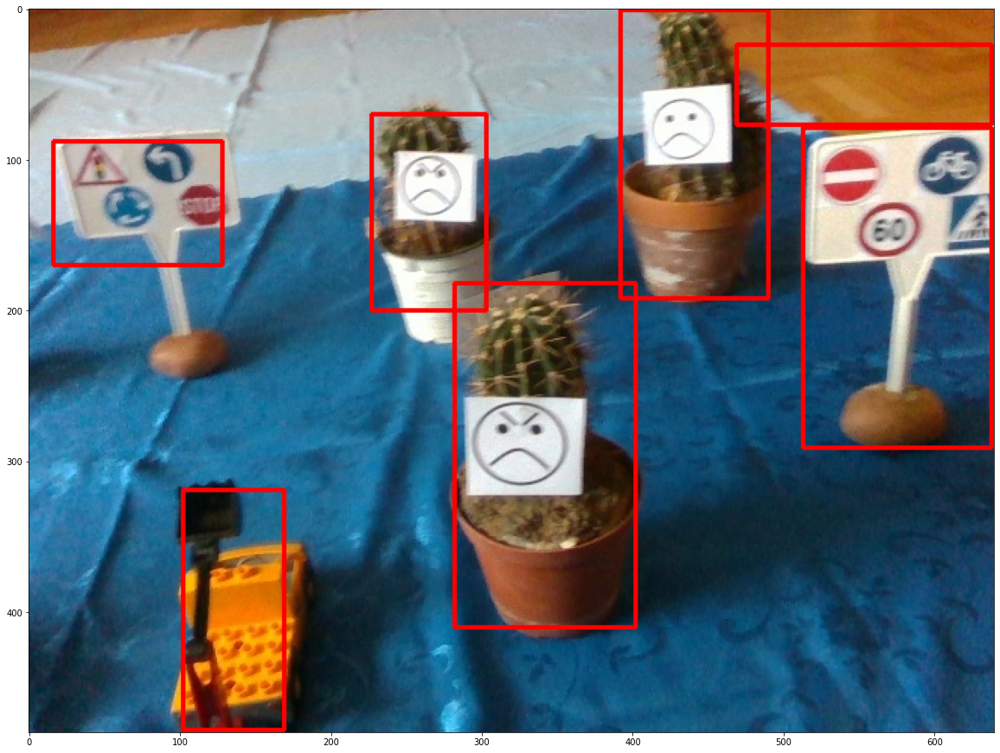

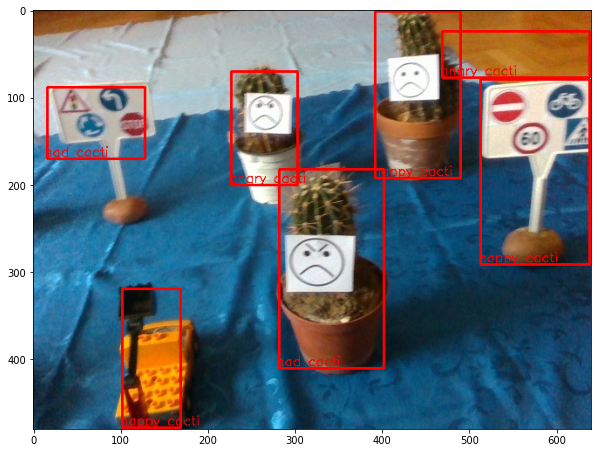

In [98]:
import imutils

def findMax(matches):
  maximum = matches[0]
  i = 0
  index = 0
  for i in range(len(matches)):
    if(matches[i][0] >= maximum[0]):
      maximum = matches[i]
      index = i
  
  return index

def findMaxBoundingRects(boundingRects):
  maxX = boundingRects[0][2]
  maxY = boundingRects[0][3]
  i = 0
  index = 0
  for i in range(len(boundingRects)):
    if(boundingRects[i][2] > maxX or boundingRects[i][3] > maxY):
      maxX = boundingRects[i][2]
      maxY = boundingRects[i][3]
  
  return (maxX,maxY)

def createTemplate(filePath):
  tH = 67
  tW = 77
  template = cv2.imread(filePath)
  template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
  tH2 = template.shape[0]
  tW2 = template.shape[1]
  yratio = tH / tH2
  xratio = tW / tW2
  final = max(yratio, xratio)
  template = cv2.resize(template, (int(tW2*final), int(tH2*final)))
  template = cv2.Canny(template, 50, 250)
  
  return template

imgBe = cv2.imread("../HW/g3/rgb/250.jpg")
depthBe = cv2.imread("../HW/g3/depth/250.png", -1)
ret, boundingRects = depth_segmenter(imgBe, depthBe, debug=False)
plt.figure(figsize=(20,20))
plt.imshow(ret,cmap='gray')

objects = []

for i in range(len(boundingRects)):
    color = (255,0,0)
    start = (int(boundingRects[i][0]),int(boundingRects[i][1])) #startX, startY
    end = (int(boundingRects[i][0]+boundingRects[i][2]) , int(boundingRects[i][1]+boundingRects[i][3])) #endX, endY
    img2 = imgBe[int(boundingRects[i][1]):int(boundingRects[i][1]+boundingRects[i][3]), int(boundingRects[i][0]):int(boundingRects[i][0]+boundingRects[i][2])]
    objects.append(img2)

maxX, maxY = findMaxBoundingRects(boundingRects)

for i in range(len(objects)):
  y = objects[i].shape[0]
  x = objects[i].shape[1]
  yratio = maxY / y
  xratio = maxX / x
  final = max(yratio, xratio)
  objects[i] = cv2.resize(objects[i], (int(x*final), int(y*final)))


template = cv2.imread('/content/CVML_HW/happyface.png')
templates.append(template)
template = cv2.imread('/content/CVML_HW/sadface.png')
templates.append(template)
template = cv2.imread('/content/CVML_HW/angryface.png')
templates.append(template)
template = cv2.imread('/content/CVML_HW/evilface.png')
templates.append(template)

i = -1
for obj in objects:
  i += 1
  matches = []
  if obj.shape[0] < tH or  obj.shape[1] < tW:
    continue
  obj = cv2.bilateralFilter(obj, 150, 50, 50)
  gray = cv2.cvtColor(obj, cv2.COLOR_BGR2HSV) 
  v = np.median(gray)
  sigma = 0.33
  lower_tresh = int(max(0, (1.0-sigma)*v))
  upper_tresh = int(min(255, (1.0+sigma)*v))
  edged = cv2.Canny(gray, lower_tresh, upper_tresh)
  result = cv2.matchTemplate(edged, templates[0], cv2.TM_CCOEFF_NORMED)
  r = 1 
  (_, maxVal0, _, maxLoc0) = cv2.minMaxLoc(result)
  match = (maxVal0, maxLoc0, r, 0)
  matches.append(match)
  result = cv2.matchTemplate(edged, templates[1], cv2.TM_CCOEFF_NORMED)
  (_, maxVal1, _, maxLoc1) = cv2.minMaxLoc(result)
  match = (maxVal1, maxLoc1, r, 1)
  matches.append(match)
  result = cv2.matchTemplate(edged, templates[2], cv2.TM_CCOEFF_NORMED)
  (_, maxVal2, _, maxLoc2) = cv2.minMaxLoc(result)
  match = (maxVal2, maxLoc2, r, 2)
  matches.append(match)
  result = cv2.matchTemplate(edged, templates[3], cv2.TM_CCOEFF_NORMED)
  (_, maxVal3, _, maxLoc3) = cv2.minMaxLoc(result)
  match = (maxVal3, maxLoc3, r, 3)
  matches.append(match)
    
  if matches == []:
    continue
  index = findMax(matches)
  #if(matches[index][0] <= 0.15):
  #  continue
  print(i)
  print(matches[index][0])
  (_, maxLoc, r, ind) = matches[index]
  text = "default text"
  if(ind == 0):
    text = "happy cacti"
  if(ind == 1):
    text = "sad cacti"
  if(ind == 2):
    text = "angry cacti"
  if(ind == 3):
    text = "evil cacti"
  #plt.figure(figsize=(10,10))
  #plt.imshow(templates[ind])
  (startX, startY) = (int(maxLoc[0] * r), int(maxLoc[1] * r))
  (endX, endY) = (int((maxLoc[0] + tW) * r), int((maxLoc[1] + tH) * r))
  xlength = boundingRects[i][1]+boundingRects[i][3]
  ystart = boundingRects[i][0]
  print(xstart,xlength, ystart, ylength)
  ret = cv2.putText(ret, text, (ystart-3,xlength-3), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,0,0), 1, cv2.LINE_4)

plt.figure(figsize=(10,10))
plt.imshow(ret)



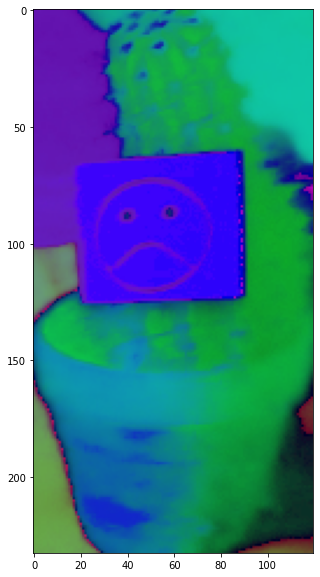

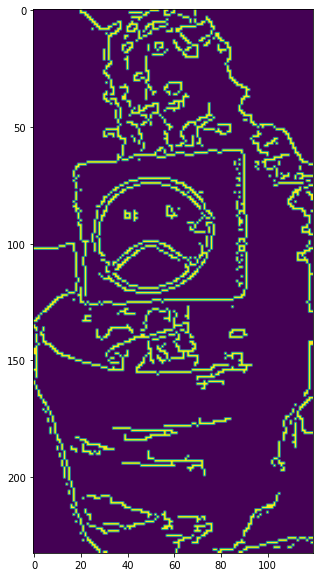

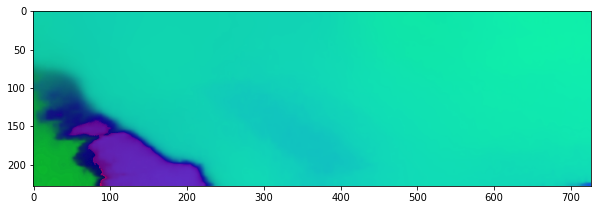

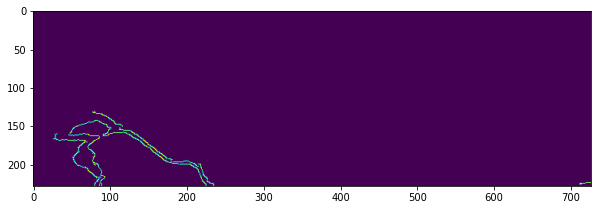

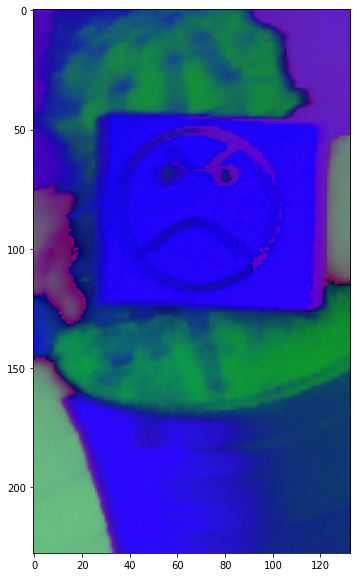

...

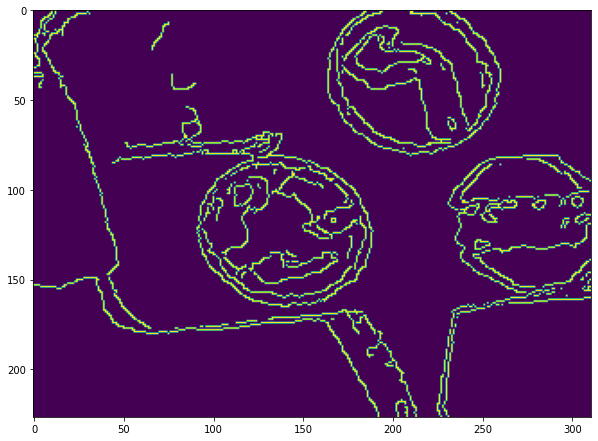

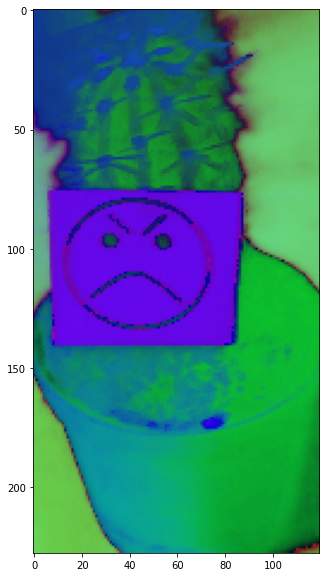

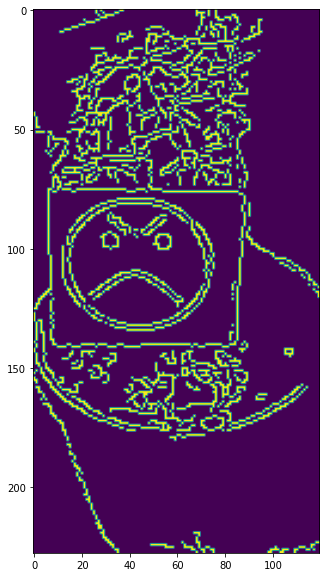

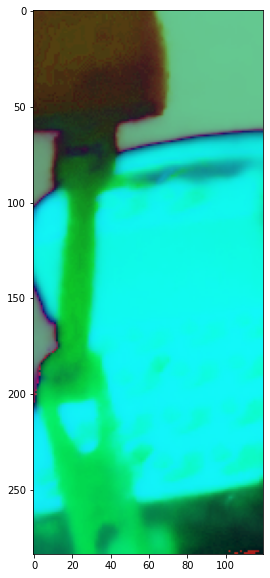

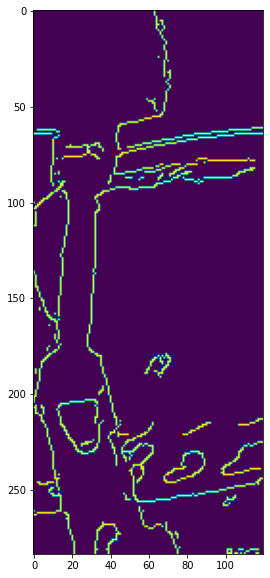

In [55]:
for obj in objects:
  obj = cv2.bilateralFilter(obj, 150, 50, 50)
  gray = cv2.cvtColor(obj, cv2.COLOR_BGR2HSV)
  plt.figure(figsize=(10,10))
  plt.imshow(gray)
  v = np.median(gray)
  sigma = 0.33
  lower_tresh = int(max(0, (1.0-sigma)*v))
  upper_tresh = int(min(255, (1.0+sigma)*v))
  edged = cv2.Canny(gray, lower_tresh, upper_tresh)
  plt.figure(figsize=(10,10))
  plt.imshow(edged)

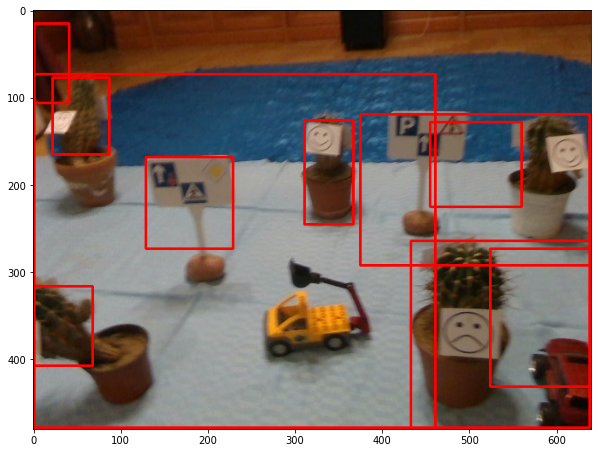

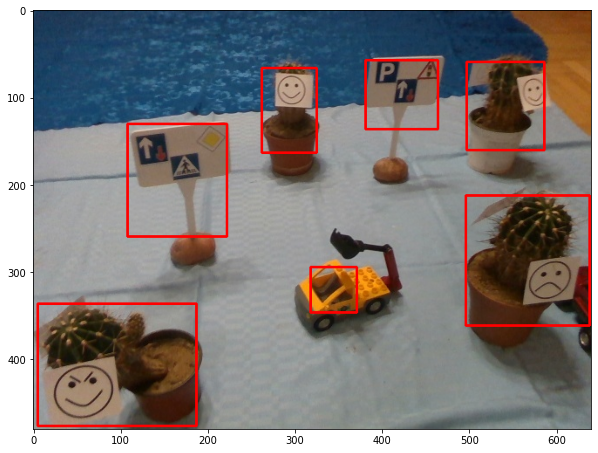

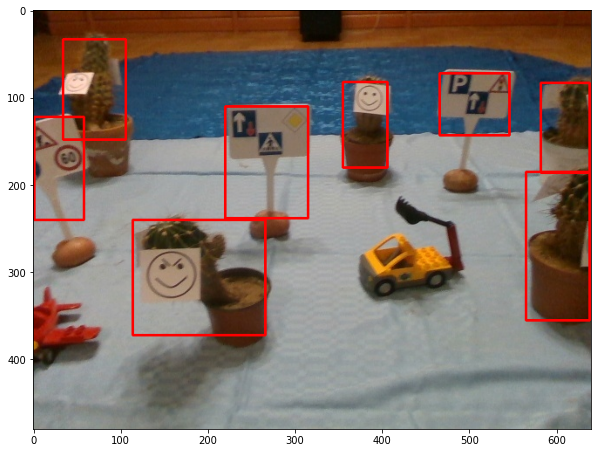

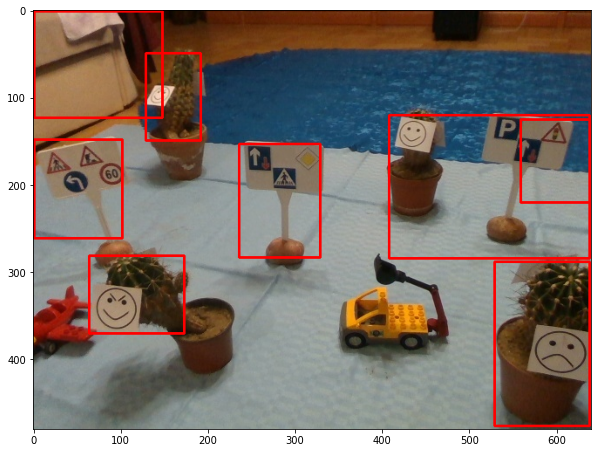

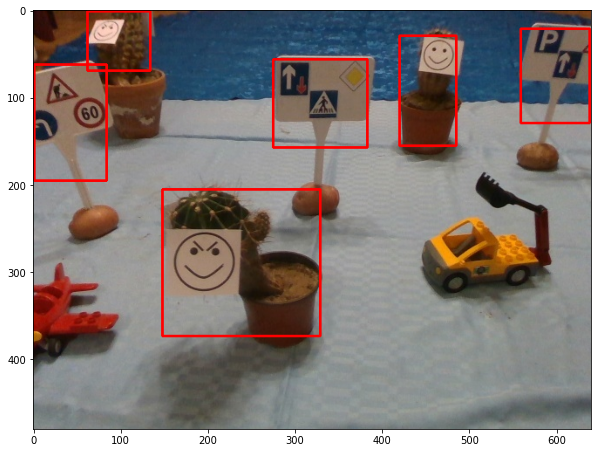

...

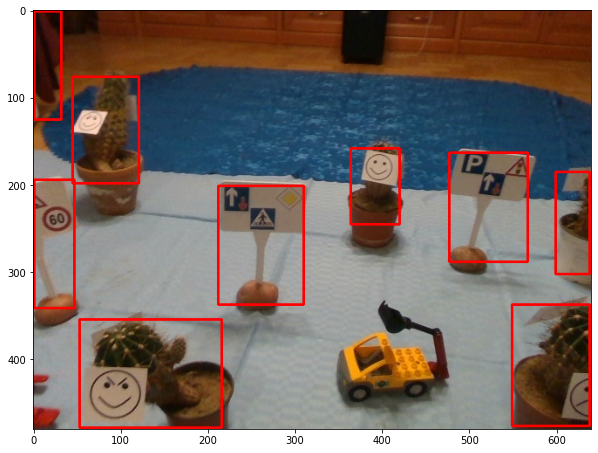

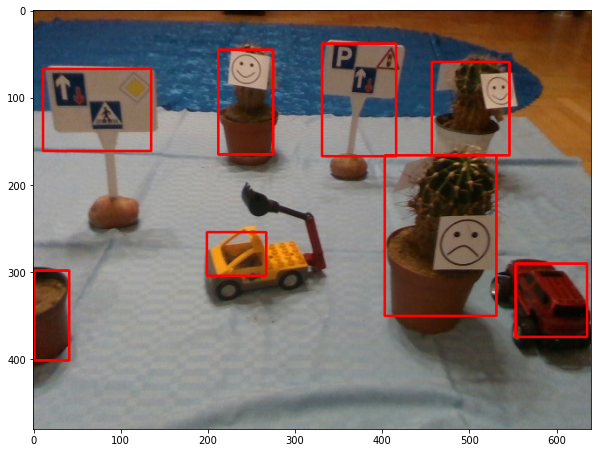

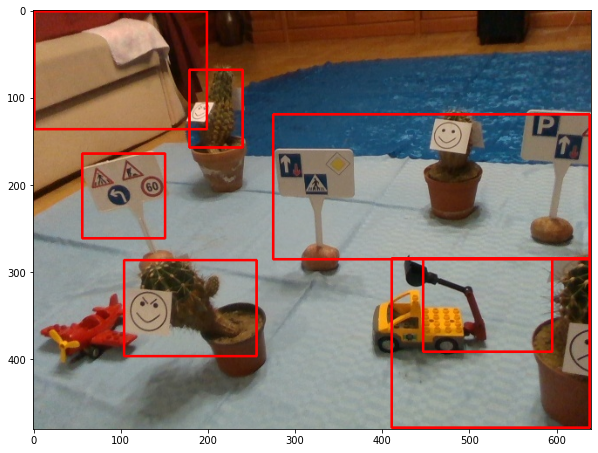

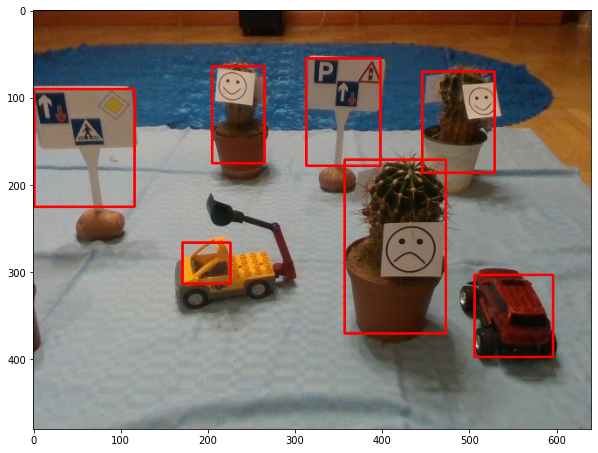

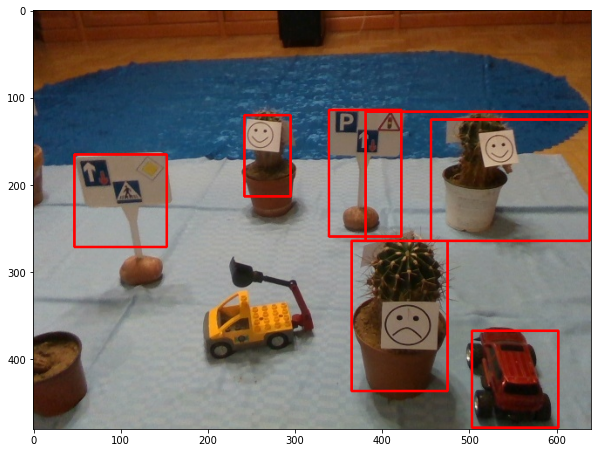

In [0]:
import glob
i=0
for file in glob.glob("../HW/g1/rgb/*.*"):
  i=i+1
  imgBGR = cv2.imread(file)
  asd = file.split("/rgb/")
  asd.append(asd[1].split(".jpg"))

  depfile = cv2.imread(asd[0]+"/depth/"+asd[2][0]+".png",-1)
  retRGB, _ = depth_segmenter(imgBGR,depfile,False)
  plt.figure(figsize=(10,10))
  plt.imshow(retRGB,cmap='gray')
  cv2.imwrite(("../HW/out/g4/"+str(i)+".jpg"),cv2.cvtColor(retRGB, cv2.COLOR_RGB2BGR))